In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import numpy as np
import re
import sys
import time
# pd.set_option('display.max_columns', 10)
# !{sys.executable} -m spacy download en
from pprint import pprint

#nlp imports
import string
import nltk
# nltk.download_shell()
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer, SnowballStemmer
from nltk.tokenize import word_tokenize
np.random.seed(2018)
nltk.download('wordnet')

np.random.seed(0)
from os import path
from googletrans import Translator
from langdetect import detect
from enchant.checker import SpellChecker
import enchant

#Vader
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

#Topic Modeling 
import gensim
from gensim.utils import lemmatize, simple_preprocess
from gensim.parsing.preprocessing import STOPWORDS
import gensim, spacy, logging, warnings
import gensim.corpora as corpora
from gensim.models import CoherenceModel
from mpl_toolkits.mplot3d import Axes3D
from sklearn.manifold import TSNE
import pickle

[nltk_data] Downloading package wordnet to
[nltk_data]     /Users/michellevenables/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


# TOPIC MODEL VISUALS

In [3]:
stop_words = stopwords.words('english')
stop_words.extend(['fly','take','plane','airline','flight','get','unitedairlines', 'unitedairline','unite','make','get','let','tell', 'airlines','from', 'subject', 're', 'edu', 'use', 'not', 
                   'would', 'say', 'could', '_', 'be', 'know', 'good', 'go', 'get', 'do', 'done', 'try', 'many', 
                   'some', 'nice', 'thank', 'think', 'see', 'rather', 'easy', 'easily', 'lot', 'lack', 'make', 'want', 
                   'seem', 'run', 'need', 'even', 'right', 'line', 'even', 'also', 'may', 'take', 'come'])

%matplotlib inline
warnings.filterwarnings("ignore",category=DeprecationWarning)
logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.ERROR)
# Import Dataset
data = pd.read_csv('new.csv', index_col=0)

In [4]:
print(data.shape)  #> (109627, 3)

(109627, 3)


In [8]:
#removing websites and pictures
data['tweet'] = data['tweet'].replace(to_replace=r'(http.*)|(https.*)|(pictwitter.*)|(pic.twitter.*)',value=']',regex=True)
data['tweet'] = data['tweet'].replace(to_replace=r'(@)|(#)',value='', regex=True)
#removing emojis1
data = data.astype(str).apply(lambda x: x.str.encode('ascii', 'ignore').str.decode('ascii'))
tweets = data['tweet']
tweets = tweets.map(lambda x: x.lower())

# VADER - Sentiment Analysis Tool 

In [9]:
#Functions
def sentiment_analyzer_scores(tweet):
    score = analyser.polarity_scores(tweet)
    print("{:-<40} {}".format(tweet, str(score)))

In [10]:
analyser = SentimentIntensityAnalyzer()

In [11]:
tweet = []
number_favourites = []
vs_compound = []
vs_pos = []
vs_neu = []
vs_neg = []
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
analyzer = SentimentIntensityAnalyzer()
for i in range(0, len(tweets)):
    tweet.append(tweets[i])
    number_favourites.append(tweets[i])
    vs_compound.append(analyzer.polarity_scores(tweets[i])['compound'])
    vs_pos.append(analyzer.polarity_scores(tweets[i])['pos'])
    vs_neu.append(analyzer.polarity_scores(tweets[i])['neu'])
    vs_neg.append(analyzer.polarity_scores(tweets[i])['neg'])

In [12]:
from pandas import Series, DataFrame
twitter_df = DataFrame({'Tweet': tweet,
                        'Favourites': number_favourites,
                        'Compound': vs_compound,
                        'Positive': vs_pos,
                        'Neutral': vs_neu,
                        'Negative': vs_neg})
twitter_df = twitter_df[['Tweet', 'Favourites', 'Compound',
                         'Positive', 'Neutral', 'Negative']]

In [ ]:
twitter_df.info()

In [ ]:
twitter_df.to_csv('twitter_sentiment.csv')

In [ ]:
pd.read_csv('twitter_sentiment.csv')

In [13]:
df_not1 = twitter_df[twitter_df['Compound'] != 1]
df_not0 = df_not1[df_not1 ['Compound'] != 0]
pos_df = df_not0[df_not0['Compound']>=0.80]
pos_df['Tweet'][27]

'leaving anchorage yesterday around sunset.  i truly love the beauty up there.  alaska flygirl alaskaairlines airphotos alaskalove mountainscapes  ]'

# Tokenize Tweets and Clean

In [15]:
def clean(mess):
    """
    Takes in a string of text, then performs the following:
    1. Remove all punctuation
    2. lowercase for all words 
    """
    # Check characters to see if they are in punctuation
    nopunc = [char for char in mess if char not in string.punctuation]
    nopunc = ''.join(nopunc)
    return nopunc

tweets = tweets.apply(clean)

In [16]:
def text_process(mess):
    """
    Takes in a string of text, then performs the following:
    1. Remove all punctuation
    2. Remove all stopwords
    3. Returns a list of the cleaned text
    """
    # Check characters to see if they are in punctuation
    nopunc = [char for char in mess if char not in string.punctuation]

    # Join the characters again to form the string.
    nopunc = ''.join(mess)
    stop_words = stopwords.words('english')
    stop_words.extend(['fly','take','plane','airline','flight','get','unitedairlines', 'unitedairline','unite','make','get','let','tell', 'airlines','from', 'subject', 're', 'edu', 'use', 'not', 
                   'would', 'say', 'could', '_', 'be', 'know', 'good', 'go', 'get', 'do', 'done', 'try', 'many', 
                   'some', 'nice', 'thank', 'think', 'see', 'rather', 'easy', 'easily', 'lot', 'lack', 'make', 'want', 
                   'seem', 'run', 'need', 'even', 'right', 'line', 'even', 'also', 'may', 'take', 'come'])
    # Now just remove any stopwords
    return [word for word in mess.split() if word.lower() not in stop_words]

In [17]:
data['tweet'] = tweets.apply(text_process)

In [18]:
stop_words = stopwords.words('english')
stop_words.extend(['airline','airlines','_',])

%matplotlib inline
warnings.filterwarnings("ignore",category=DeprecationWarning)
logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.ERROR)

In [19]:
def sent_to_words(tweets):
    for twt in tweets:
        twt = re.sub('\s+', ' ', twt)  # remove newline chars
        twt = re.sub("\'", "", twt)  # remove single quotes
        twt = gensim.utils.simple_preprocess(str(twt), deacc=True) 
        yield(twt)  

# Convert to list
clean_data = data.tweet.values.tolist()

In [23]:
data.to_csv('data_sl.csv')

# Build the Bigram, Trigram Models and Lemmatize

In [20]:
# Build the bigram and trigram models
bigram = gensim.models.Phrases(clean_data, min_count=3, threshold=100) # higher threshold fewer phrases.
trigram = gensim.models.Phrases(bigram[clean_data], threshold=100)  
bigram_mod = gensim.models.phrases.Phraser(bigram)
trigram_mod = gensim.models.phrases.Phraser(trigram)

# !python3 -m spacy download en  # run in terminal once
def process_words(texts, stop_words=stop_words, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV']):
    """Remove Stopwords, Form Bigrams, Trigrams and Lemmatization"""
    texts = [[word for word in simple_preprocess(str(doc)) if word not in stop_words] for doc in texts]
    texts = [bigram_mod[doc] for doc in texts]
    texts = [trigram_mod[bigram_mod[doc]] for doc in texts]
    texts_out = []
    nlp = spacy.load('en', disable=['parser', 'ner'])
    for sent in texts:
        doc = nlp(" ".join(sent)) 
        texts_out.append([token.lemma_ for token in doc if token.pos_ in allowed_postags])
    # remove stopwords once more after lemmatization
    texts_out = [[word for word in simple_preprocess(str(doc)) if word not in stop_words] for doc in texts_out]    
    return texts_out

data_ready = process_words(clean_data)  # processed Text Data!

In [21]:
data_ready_df = pd.DataFrame(data_ready)
data_ready_df.to_csv('data_ready.csv', index=False, header=False)

In [22]:
dictionary = gensim.corpora.Dictionary(data_ready)
count = 0
for k, v in dictionary.iteritems():
    print(k, v)
    count += 1
    if count > 10:
        break

0 alaskaairline
1 buy
2 promo
3 run
4 bankruptcy
5 ever
6 ill
7 stuff
8 suck
9 swindle
10 andor


In [27]:
#PICKLE
pickle.dump(data_ready, open("data_ready.pkl", 'wb'))
pickle.dump(dictionary, open("dictionary_sl.pkl", 'wb'))

In [23]:
#EXTREMES
dictionary.filter_extremes(no_below=15, no_above=0.66, keep_n=10000)

In [30]:
bow_corpus = [dictionary.doc2bow(doc) for doc in data['tweet']]

# Build the Topic Model - LDAModel()

In [24]:
warnings.filterwarnings("ignore",category=DeprecationWarning)
# Create Dictionary
from tqdm import tqdm_notebook as tqdm
tqdm().pandas()
id2word = corpora.Dictionary(data_ready)
dictionary.filter_extremes(no_below=10, no_above=0.66, keep_n=100000)

# Create Corpus: Term Document Frequency
corpus = [id2word.doc2bow(text) for text in data_ready]

# Build LDA model
tqdm().pandas()
lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus,
                                           id2word=id2word,
                                           num_topics=3, 
                                           random_state=100,
                                           update_every=1,
                                           chunksize=10,
                                           passes=10,
                                           alpha='symmetric',
                                           iterations=100,
                                           per_word_topics=True)

pprint(lda_model.print_topics())

/Users/michellevenables/anaconda3/lib/python3.7/site-packages/gensim/models/ldamodel.py:821: RuntimeWarning: divide by zero encountered in double_scalars
  perwordbound = self.bound(chunk, subsample_ratio=subsample_ratio) / (subsample_ratio * corpus_words)


[(0,
  '0.035*"customer" + 0.029*"service" + 0.023*"bad" + 0.022*"travel" + '
  '0.015*"ever" + 0.014*"check" + 0.013*"bag" + 0.013*"people" + 0.013*"make" '
  '+ 0.011*"give"'),
 (1,
  '0.038*"delay" + 0.038*"hour" + 0.026*"time" + 0.020*"fly" + 0.017*"flight" '
  '+ 0.017*"get" + 0.016*"airport" + 0.016*"never" + 0.015*"wait" + '
  '0.013*"day"'),
 (2,
  '0.024*"help" + 0.023*"take" + 0.023*"great" + 0.022*"thank" + 0.021*"today" '
  '+ 0.015*"care" + 0.014*"look" + 0.010*"always" + 0.010*"experience" + '
  '0.010*"good"')]


In [25]:
from gensim.test.utils import datapath

# Save model to disk.
temp_file = datapath("model")
lda_model.save(temp_file)

# Coherence 

- from Data cleaning notebook

In [26]:
#conda install -c plotly plotly-orca psutil requests
#!pip install psutil requests
import os
if not os.path.exists("images"):
    os.mkdir("images")

In [28]:
from pandas import Series, DataFrame

#Scores from cleaning data notebook 
coherence_df = DataFrame({'Topic numbers': [2,3,4,5,6,7,8,9], 'CoherenceScores': [0.32,0.44,0.41,0.39,0.39,0.40,0.42,0.43]})
coherence_df = twitter_df[['Tweet', 'Favourites']]

# Have a look at the top 5 results.
# twitter_df.head()

In [29]:
import plotly.graph_objects as go

fig = go.Figure(go.Scatter(
    y=[0.32,0.44,0.41,0.39,0.39,0.40,0.42,0.43],
    x=[2,3,4,5,6,7,8,9]))

fig.update_layout(
    xaxis_title="Number of Topics",
    yaxis_title="Coherence Score",
    title={
        'text': "Coherence Scores",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})
fig.write_image("images/fig1.png")
fig.show()

# Pickle file

In [38]:
filename = 'lda_model.pkl'

In [39]:
#PICKLE
pickle.dump(lda_model, open(filename, 'wb'))

In [40]:
loaded_model = pickle.load(open(filename, 'rb'))

In [41]:
loaded_model

# What is the Dominant topic and its percentage contribution in each document?

In [33]:
def format_topics_sentences(ldamodel=None, corpus=corpus, texts=data):
    # Init output
    sent_topics_df = pd.DataFrame()

    # Get main topic in each document
    for i, row_list in enumerate(ldamodel[corpus]):
        row = row_list[0] if ldamodel.per_word_topics else row_list            
        # print(row)
        row = sorted(row, key=lambda x: (x[1]), reverse=True)
        # Get the Dominant topic, Perc Contribution and Keywords for each document
        for j, (topic_num, prop_topic) in enumerate(row):
            if j == 0:  # => dominant topic
                wp = ldamodel.show_topic(topic_num)
                topic_keywords = ", ".join([word for word, prop in wp])
                sent_topics_df = sent_topics_df.append(pd.Series([int(topic_num), round(prop_topic,3), topic_keywords]), ignore_index=True)
            else:
                break
    sent_topics_df.columns = ['Dominant_Topic', 'Perc_Contribution', 'Topic_Keywords']

    # Add original text to the end of the output
    contents = pd.Series(texts)
    sent_topics_df = pd.concat([sent_topics_df, contents], axis=1)
    return(sent_topics_df)


%time df_topic_sents_keywords = format_topics_sentences(ldamodel=lda_model, corpus=corpus, texts=data_ready)

# Format
%time df_dominant_topic = df_topic_sents_keywords.reset_index()
%time df_dominant_topic.columns = ['Document_No', 'Dominant_Topic', 'Topic_Perc_Contrib', 'Keywords', 'Text']
df_dominant_topic.head(10)

CPU times: user 7min 40s, sys: 10.7 s, total: 7min 51s
Wall time: 7min 51s
CPU times: user 21 ms, sys: 2.1 ms, total: 23.1 ms
Wall time: 25.5 ms
CPU times: user 346 µs, sys: 40 µs, total: 386 µs
Wall time: 380 µs


,Document_No,Dominant_Topic,Topic_Perc_Contrib,Keywords,Text
0,0,1.0,0.666,"delay, hour, time, fly, flight, get, airport, ...",[alaskaairline]
1,1,0.0,0.472,"customer, service, bad, travel, ever, check, b...","[buy, promo, run]"
2,2,0.0,0.333,"customer, service, bad, travel, ever, check, b...",[]
3,3,1.0,0.535,"delay, hour, time, fly, flight, get, airport, ...","[suck, ever, bankruptcy, swindle, alaskaairlin..."
4,4,2.0,0.653,"help, take, great, thank, today, care, look, a...","[folk, network, developer, alaskaairline, andor]"
5,5,0.0,0.457,"customer, service, bad, travel, ever, check, b...","[live, funkopop, alaskaairline]"
6,6,1.0,0.474,"delay, hour, time, fly, flight, get, airport, ...","[explore, attraction, walk, trail, alaskaair]"
7,7,0.0,0.333,"customer, service, bad, travel, ever, check, b...",[]
8,8,0.0,0.333,"customer, service, bad, travel, ever, check, b...",[]
9,9,0.0,0.449,"customer, service, bad, travel, ever, check, b...","[say, alaskaairline]"


In [43]:
len(data_ready)

109627

In [30]:
#data_ready.to_csv("data_ready.csv")

In [31]:
len(data)

109627

In [34]:
df_topic_sents_keywords.head()

,Dominant_Topic,Perc_Contribution,Topic_Keywords,0
0,1.0,0.666,"delay, hour, time, fly, flight, get, airport, ...",[alaskaairline]
1,0.0,0.472,"customer, service, bad, travel, ever, check, b...","[buy, promo, run]"
2,0.0,0.333,"customer, service, bad, travel, ever, check, b...",[]
3,1.0,0.535,"delay, hour, time, fly, flight, get, airport, ...","[suck, ever, bankruptcy, swindle, alaskaairlin..."
4,2.0,0.653,"help, take, great, thank, today, care, look, a...","[folk, network, developer, alaskaairline, andor]"


# The most representative Tweet 

In [ ]:
# Display setting to show more characters in column
pd.options.display.max_colwidth = 100

sent_topics_sorteddf_mallet = pd.DataFrame()
sent_topics_outdf_grpd = df_topic_sents_keywords.groupby('Dominant_Topic')

for i, grp in sent_topics_outdf_grpd:
    sent_topics_sorteddf_mallet = pd.concat([sent_topics_sorteddf_mallet, 
                                             grp.sort_values(['Perc_Contribution'], ascending=False).head(1)], 
                                            axis=0)

# Reset Index    
sent_topics_sorteddf_mallet.reset_index(drop=True, inplace=True)

# Format
sent_topics_sorteddf_mallet.columns = ['Topic_Num', "Topic_Perc_Contrib", "Keywords", "Representative Text"]

# Show
sent_topics_sorteddf_mallet.head(10)

In [ ]:
sent_topics_sorteddf_mallet['Representative Text'][0]

In [ ]:
sent_topics_sorteddf_mallet['Representative Text'][1]

# Frequency Distribution of Word Counts in Documents

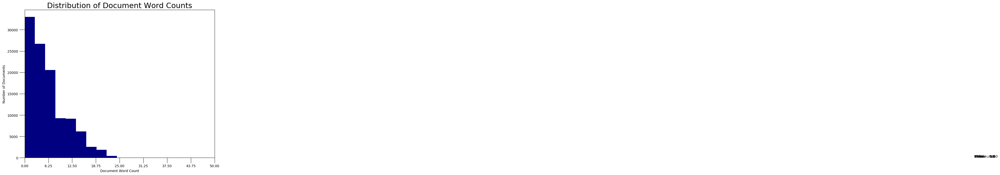

In [39]:
doc_lens = [len(d) for d in df_dominant_topic.Text]

# Plot
plt.figure(figsize=(10,8), dpi=100)
plt.hist(doc_lens, bins = 10, color='navy')
plt.text(250, 100, "Mean   : " + str(round(np.mean(doc_lens))))
plt.text(250,  90, "Median : " + str(round(np.median(doc_lens))))
plt.text(250,  80, "Stdev   : " + str(round(np.std(doc_lens))))
plt.text(250,  70, "1%ile    : " + str(round(np.quantile(doc_lens, q=0.01))))
plt.text(250,  60, "99%ile  : " + str(round(np.quantile(doc_lens, q=0.99))))

plt.gca().set(xlim=(0, 50), ylabel='Number of Documents', xlabel='Document Word Count')
plt.tick_params(size=16)
plt.xticks(np.linspace(0,50,9))
plt.title('Distribution of Document Word Counts', fontdict=dict(size=22))
plt.show()

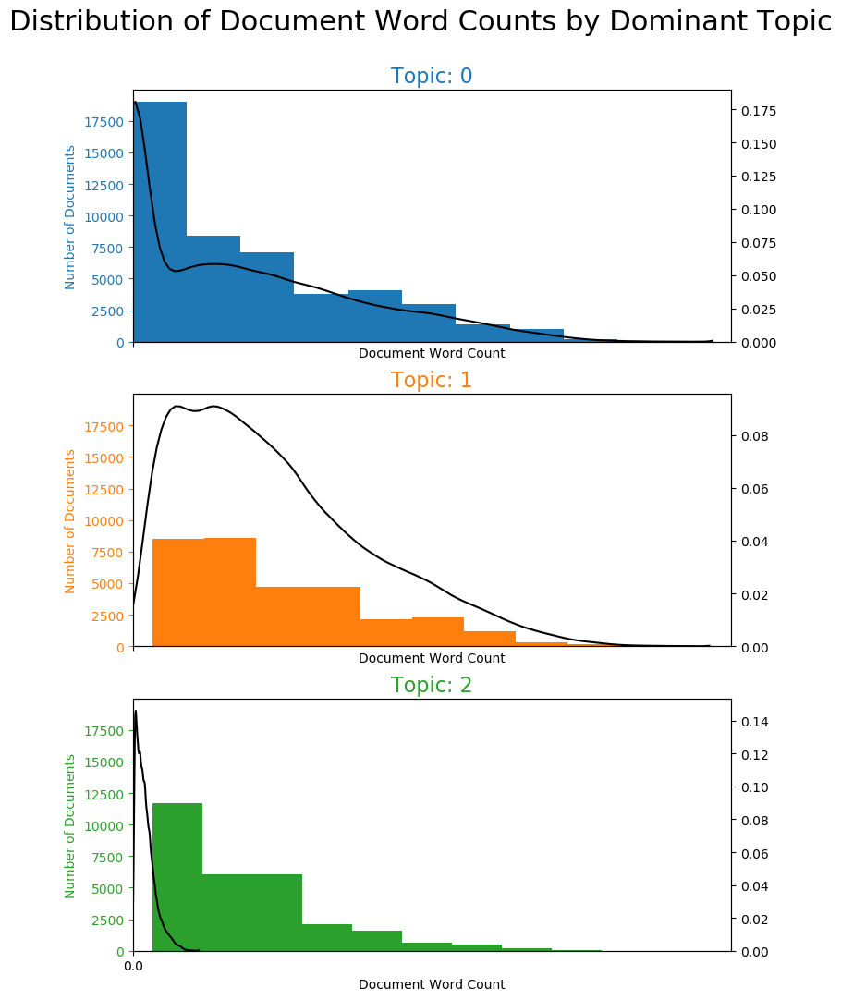

In [48]:
import seaborn as sns
import matplotlib.colors as mcolors
cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]  # more colors: 'mcolors.XKCD_COLORS'

fig, axes = plt.subplots(3,1,figsize=(8,11), dpi=100, sharex=True, sharey=True)

for i, ax in enumerate(axes.flatten()):    
    df_dominant_topic_sub = df_dominant_topic.loc[df_dominant_topic.Dominant_Topic == i, :]
    doc_lens = [len(d) for d in df_dominant_topic_sub.Text]
    ax.hist(doc_lens, bins = 10, color=cols[i])
    ax.tick_params(axis='y', labelcolor=cols[i], color=cols[i])
    sns.kdeplot(doc_lens, color="black", shade=False, ax=ax.twinx())
    ax.set(xlim=(0, 30), xlabel='Document Word Count')
    ax.set_ylabel('Number of Documents', color=cols[i])
    ax.set_title('Topic: '+str(i), fontdict=dict(size=16, color=cols[i]))

fig.tight_layout()
fig.subplots_adjust(top=0.90)
plt.xticks(np.linspace(0,250,9))
fig.suptitle('Distribution of Document Word Counts by Dominant Topic', fontsize=22)
plt.show()

# Word Clouds of Top N Keywords in Each Topic

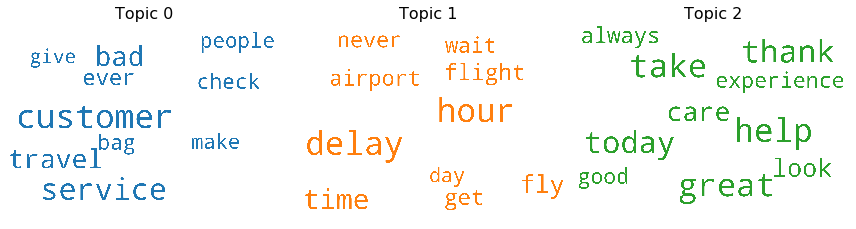

In [49]:
# 1. Wordcloud of Top N words in each topic
from matplotlib import pyplot as plt
from wordcloud import WordCloud, STOPWORDS
import matplotlib.colors as mcolors

cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]  # more colors: 'mcolors.XKCD_COLORS'

cloud = WordCloud(stopwords=stop_words,
                  background_color='white',
                  width=2500,
                  height=1800,
                  max_words=20,
                  colormap='tab10',
                  color_func=lambda *args, **kwargs: cols[i],
                  prefer_horizontal=1.0)

topics = lda_model.show_topics(formatted=False)

fig, axes = plt.subplots(1, 3, figsize=(12,12), sharex=True, sharey=True)

for i, ax in enumerate(axes.flatten()):
    fig.add_subplot(ax)
    topic_words = dict(topics[i][1])
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    plt.gca().imshow(cloud)
    plt.gca().set_title('Topic ' + str(i), fontdict=dict(size=16))
    plt.gca().axis('off')


plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout()
plt.show()

In [51]:
data = go.Scatter(mode='text',
                 text=words,
                 marker={'opacity': 0.3},
                 textfont={'size': weights,
                           'color': colors})
layout = go.Layout({'xaxis': {'showgrid': False, 'showticklabels': False, 'zeroline': False},
                    'yaxis': {'showgrid': False, 'showticklabels': False, 'zeroline': False}})
fig = go.Figure(data=topics, layout=layout)

NameError: name 'weights' is not defined

# Word Counts of Topic Keywords
- shows the weights per word per topic

In [46]:
topics


NameError: name 'topics' is not defined

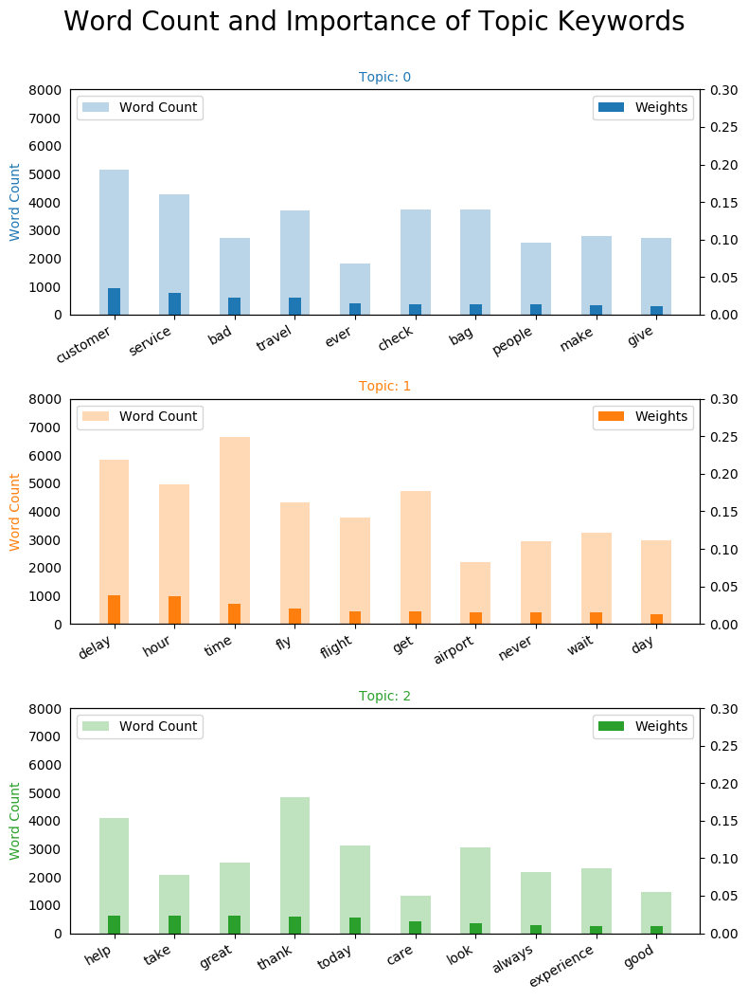

In [52]:
from collections import Counter
topics = lda_model.show_topics(formatted=False)
data_flat = [w for w_list in data_ready for w in w_list]
counter = Counter(data_flat)

out = []
for i, topic in topics:
    for word, weight in topic:
        out.append([word, i , weight, counter[word]])

df = pd.DataFrame(out, columns=['word', 'topic_id', 'importance', 'word_count'])        

# Plot Word Count and Weights of Topic Keywords
fig, axes = plt.subplots(3, 1, figsize=(8,10), sharey=True, dpi=100)
cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]
for i, ax in enumerate(axes.flatten()):
    ax.bar(x='word', height="word_count", data=df.loc[df.topic_id==i, :], color=cols[i], width=0.5, alpha=0.3, label='Word Count')
    ax_twin = ax.twinx()
    ax_twin.bar(x='word', height="importance", data=df.loc[df.topic_id==i, :], color=cols[i], width=0.2, label='Weights')
    ax.set_ylabel('Word Count', color=cols[i])
    ax_twin.set_ylim(0, 0.3); ax.set_ylim(0, 8000)
    ax.set_title('Topic: ' + str(i), color=cols[i], fontsize=10)
    ax.tick_params(axis='y', left=False)
    ax.set_xticklabels(df.loc[df.topic_id==i, 'word'], rotation=30, horizontalalignment= 'right')
    ax.legend(loc='upper left'); ax_twin.legend(loc='upper right')

fig.tight_layout(w_pad=2)    
fig.suptitle('Word Count and Importance of Topic Keywords', fontsize=20, y=1.05)    
plt.show()

# Sentence Chart Colored by Topic

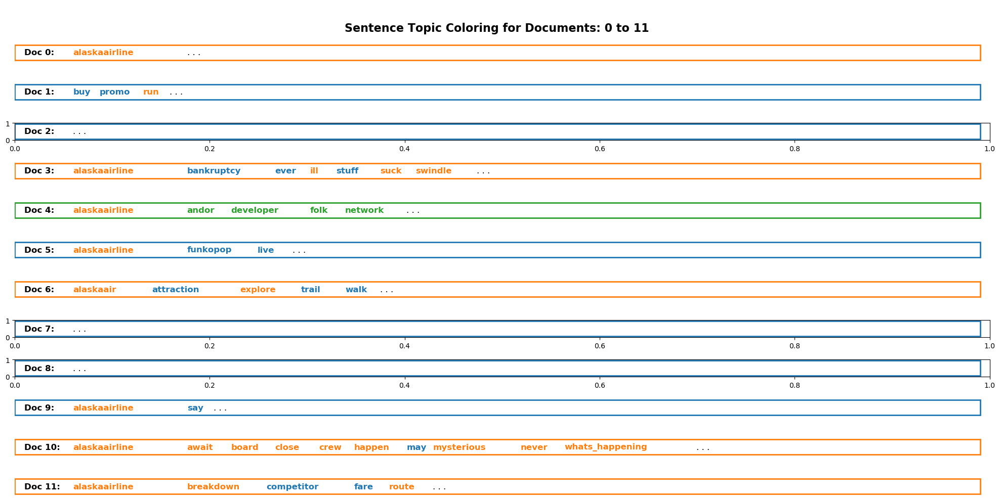

In [53]:
# Sentence Coloring of N Sentences
from matplotlib.patches import Rectangle

def sentences_chart(lda_model=lda_model, corpus=corpus, start = 0, end = 13):
    corp = corpus[start:end]
    mycolors = [color for name, color in mcolors.TABLEAU_COLORS.items()]

    fig, axes = plt.subplots(end-start, 1, figsize=(20, 10), dpi=100)       
    axes[0].axis('off')
    for i, ax in enumerate(axes):
        if i > 0:
            corp_cur = corp[i-1] 
            topic_percs, wordid_topics, wordid_phivalues = lda_model[corp_cur]
            word_dominanttopic = [(lda_model.id2word[wd], topic[0]) for wd, topic in wordid_topics]    
            ax.text(0.01, 0.5, "Doc " + str(i-1) + ": ", verticalalignment='center',
                    fontsize=12, color='black', transform=ax.transAxes, fontweight=600)

            # Draw Rectange
            topic_percs_sorted = sorted(topic_percs, key=lambda x: (x[1]), reverse=True)
            ax.add_patch(Rectangle((0.0, 0.05), 0.99, 0.90, fill=None, alpha=1, 
                                   color=mycolors[topic_percs_sorted[0][0]], linewidth=2))

            word_pos = 0.06
            for j, (word, topics) in enumerate(word_dominanttopic):
                if j < 14:
                    ax.text(word_pos, 0.5, word,
                            horizontalalignment='left',
                            verticalalignment='center',
                            fontsize=12, color=mycolors[topics],
                            transform=ax.transAxes, fontweight=700)
                    word_pos += .009 * len(word)  # to move the word for the next iter
                    ax.axis('off')
            ax.text(word_pos, 0.5, '. . .',
                    horizontalalignment='left',
                    verticalalignment='center',
                    fontsize=12, color='black',
                    transform=ax.transAxes)       

    plt.subplots_adjust(wspace=0, hspace=0)
    plt.suptitle('Sentence Topic Coloring for Documents: ' + str(start) + ' to ' + str(end-2), fontsize=16, y=0.95, fontweight=600)
    plt.tight_layout()
    plt.show()

sentences_chart()

# What are the most discussed topics in the documents?

In [54]:
# Sentence Coloring of N Sentences
def topics_per_document(model, corpus, start=0, end=1):
    corpus_sel = corpus[start:end]
    dominant_topics = []
    topic_percentages = []
    for i, corp in enumerate(corpus_sel):
        topic_percs, wordid_topics, wordid_phivalues = model[corp]
        dominant_topic = sorted(topic_percs, key = lambda x: x[1], reverse=True)[0][0]
        dominant_topics.append((i, dominant_topic))
        topic_percentages.append(topic_percs)
    return(dominant_topics, topic_percentages)

dominant_topics, topic_percentages = topics_per_document(model=lda_model, corpus=corpus, end=-1)            

# Distribution of Dominant Topics in Each Document
df = pd.DataFrame(dominant_topics, columns=['Document_Id', 'Dominant_Topic'])
dominant_topic_in_each_doc = df.groupby('Dominant_Topic').size()
df_dominant_topic_in_each_doc = dominant_topic_in_each_doc.to_frame(name='count').reset_index()

# Total Topic Distribution by actual weight
topic_weightage_by_doc = pd.DataFrame([dict(t) for t in topic_percentages])
df_topic_weightage_by_doc = topic_weightage_by_doc.sum().to_frame(name='count').reset_index()

# Top 3 Keywords for each Topic
topic_top3words = [(i, topic) for i, topics in lda_model.show_topics(formatted=False) 
                                 for j, (topic, wt) in enumerate(topics) if j < 3]

df_top3words_stacked = pd.DataFrame(topic_top3words, columns=['topic_id', 'words'])
df_top3words = df_top3words_stacked.groupby('topic_id').agg(', \n'.join)
df_top3words.reset_index(level=0,inplace=True)

Let’s make two plots:

1. The number of documents for each topic by assigning the document to the topic that has the most weight in that document.
2. The number of documents for each topic by by summing up the actual weight contribution of each topic to respective documents.

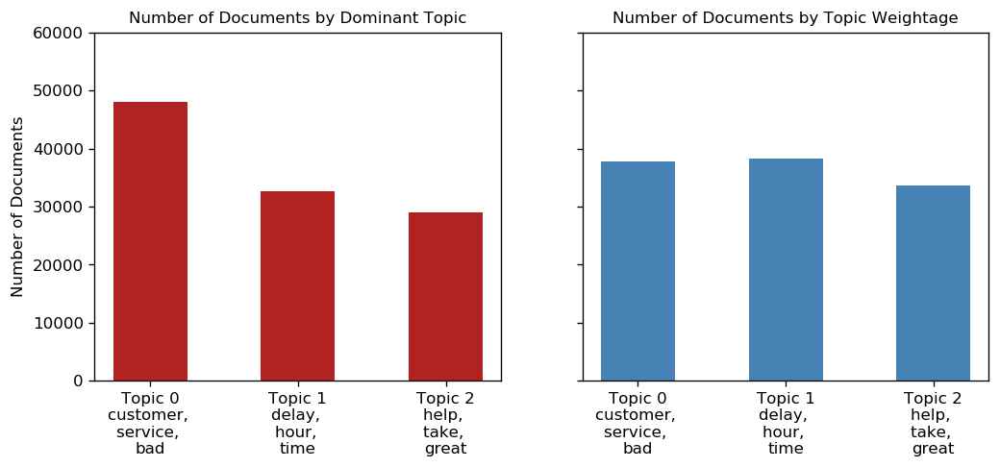

In [55]:
from matplotlib.ticker import FuncFormatter

# Plot
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4), dpi=120, sharey=True)

# Topic Distribution by Dominant Topics
ax1.bar(x='Dominant_Topic', height='count', data=df_dominant_topic_in_each_doc, width=.5, color='firebrick')
ax1.set_xticks(range(df_dominant_topic_in_each_doc.Dominant_Topic.unique().__len__()))
tick_formatter = FuncFormatter(lambda x, pos: 'Topic ' + str(x)+ '\n' + df_top3words.loc[df_top3words.topic_id==x, 'words'].values[0])
ax1.xaxis.set_major_formatter(tick_formatter)
ax1.set_title('Number of Documents by Dominant Topic', fontdict=dict(size=10))
ax1.set_ylabel('Number of Documents')
ax1.set_ylim(0, 60000)

# Topic Distribution by Topic Weights
ax2.bar(x='index', height='count', data=df_topic_weightage_by_doc, width=.5, color='steelblue')
ax2.set_xticks(range(df_topic_weightage_by_doc.index.unique().__len__()))
ax2.xaxis.set_major_formatter(tick_formatter)
ax2.set_title('Number of Documents by Topic Weightage', fontdict=dict(size=10))

plt.show()

In [56]:
df_dominant_topic_in_each_doc

,Dominant_Topic,count
0,0,48019
1,1,32687
2,2,28920


# t-SNE Clustering Chart - 2D Space
Let’s visualize the clusters of documents in a 2D space using t-SNE (t-distributed stochastic neighbor embedding) algorithm.

In [57]:
mycolors

NameError: name 'mycolors' is not defined

In [58]:
# Get topic weights and dominant topics ------------(run the pickle below instead... model takes time)
from sklearn.manifold import TSNE
from bokeh.plotting import figure, output_file, show
from bokeh.models import Label
from bokeh.io import output_notebook

# Get topic weights
topic_weights = []
for i, row_list in enumerate(lda_model[corpus]):
    topic_weights.append([w for i, w in row_list[0]])

# Array of topic weights    
arr = pd.DataFrame(topic_weights).fillna(0).values

# Keep the well separated points (optional)
arr = arr[np.amax(arr, axis=1) > 0.35]

# Dominant topic number in each doc
topic_num = np.argmax(arr, axis=1)

# tSNE Dimension Reduction
tsne_model = TSNE(n_components=2, verbose=1, random_state=0, angle=.99, init='pca')
tsne_lda = tsne_model.fit_transform(arr)

# Plot the Topic Clusters using Bokeh
output_notebook()
n_topics = 3
mycolors = np.array([color for name, color in mcolors.TABLEAU_COLORS.items()])
plot = figure(title="t-SNE Clustering of {} LDA Topics".format(n_topics), 
              plot_width=900, plot_height=700)
plot.scatter(x=tsne_lda[:,0], y=tsne_lda[:,1], color=mycolors[topic_num])

plot.title.text = "t-SNE Cluster"
plot.title.align = "right"
plot.title.text_font_size = "25px"

show(plot)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 94493 samples in 0.040s...
[t-SNE] Computed neighbors for 94493 samples in 1.627s...
[t-SNE] Computed conditional probabilities for sample 1000 / 94493
[t-SNE] Computed conditional probabilities for sample 2000 / 94493
[t-SNE] Computed conditional probabilities for sample 3000 / 94493
[t-SNE] Computed conditional probabilities for sample 4000 / 94493
[t-SNE] Computed conditional probabilities for sample 5000 / 94493
[t-SNE] Computed conditional probabilities for sample 6000 / 94493
[t-SNE] Computed conditional probabilities for sample 7000 / 94493
[t-SNE] Computed conditional probabilities for sample 8000 / 94493
[t-SNE] Computed conditional probabilities for sample 9000 / 94493
[t-SNE] Computed conditional probabilities for sample 10000 / 94493
[t-SNE] Computed conditional probabilities for sample 11000 / 94493
[t-SNE] Computed conditional probabilities for sample 12000 / 94493
[t-SNE] Computed conditional probabilities for sam

Loading BokehJS ...

In [54]:
# PICKLE
filename = 'tsne2d_model.pkl'
pickle.dump(tsne_lda, open(filename, 'wb'))
loaded_model2 = pickle.load(open(filename, 'rb'))
output_notebook()
n_topics = 3
mycolors = np.array([color for name, color in mcolors.TABLEAU_COLORS.items()])
plot = figure(title="t-SNE Clustering of {} LDA Topics".format(n_topics), 
              plot_width=900, plot_height=700)
plot.scatter(x=loaded_model2[:,0], y=loaded_model2[:,1], color=mycolors[topic_num])
show(plot)

Loading BokehJS ...

In [ ]:
topic_num

# t-SNE Clustering Chart - 3D space
Let’s visualize the clusters of documents in a 3D space using t-SNE (t-distributed stochastic neighbor embedding) algorithm.

In [55]:
from __future__ import print_function
import time
import numpy as np
import pandas as pd
from sklearn.datasets import fetch_mldata
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
%matplotlib inline
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns

In [56]:
df = pd.DataFrame(arr)
print(len(df))
print(len(arr))

94493
94493


In [57]:
# RUN PICKLE FILE INSTEAD
tsne_model = TSNE(n_components=3, verbose=1, random_state=0, angle=.99, init='pca')
tsne_result = tsne_model.fit_transform(arr)
df['pca-one-tsne'] = tsne_result[:,0]
df['pca-two-tsne'] = tsne_result[:,1] 
df['pca-three-tsne'] = tsne_result[:,2]

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 94493 samples in 0.036s...
[t-SNE] Computed neighbors for 94493 samples in 1.409s...
[t-SNE] Computed conditional probabilities for sample 1000 / 94493
[t-SNE] Computed conditional probabilities for sample 2000 / 94493
[t-SNE] Computed conditional probabilities for sample 3000 / 94493
[t-SNE] Computed conditional probabilities for sample 4000 / 94493
[t-SNE] Computed conditional probabilities for sample 5000 / 94493
[t-SNE] Computed conditional probabilities for sample 6000 / 94493
[t-SNE] Computed conditional probabilities for sample 7000 / 94493
[t-SNE] Computed conditional probabilities for sample 8000 / 94493
[t-SNE] Computed conditional probabilities for sample 9000 / 94493
[t-SNE] Computed conditional probabilities for sample 10000 / 94493
[t-SNE] Computed conditional probabilities for sample 11000 / 94493
[t-SNE] Computed conditional probabilities for sample 12000 / 94493
[t-SNE] Computed conditional probabilities for sam

In [58]:
# PICKLE
filename3d = 'tsne3d_model.pkl'
pickle.dump(tsne_result, open(filename3d, 'wb'))
loaded_model_3d = pickle.load(open(filename3d, 'rb'))
output_notebook()
n_topics = 3
mycolors = np.array([color for name, color in mcolors.TABLEAU_COLORS.items()])
plot = figure(title="t-SNE Clustering of {} LDA Topics".format(n_topics), 
              plot_width=900, plot_height=700)
plot.scatter(x=loaded_model_3d[:,0], y=loaded_model_3d[:,1], color=mycolors[topic_num])
show(plot)

Loading BokehJS ...

In [59]:
df.head()

,0,1,2,pca-one-tsne,pca-two-tsne,pca-three-tsne
0,0.167036,0.666176,0.166788,-4.801011,-9.062344,-20.170977
1,0.472296,0.438019,0.089685,-14.394503,6.686234,15.604849
2,0.416813,0.535206,0.047982,-19.447977,1.991320,5.179028
3,0.057572,0.289749,0.652679,13.696325,-15.961684,-3.982675
4,0.457298,0.441255,0.101447,-14.842312,4.567535,18.957439


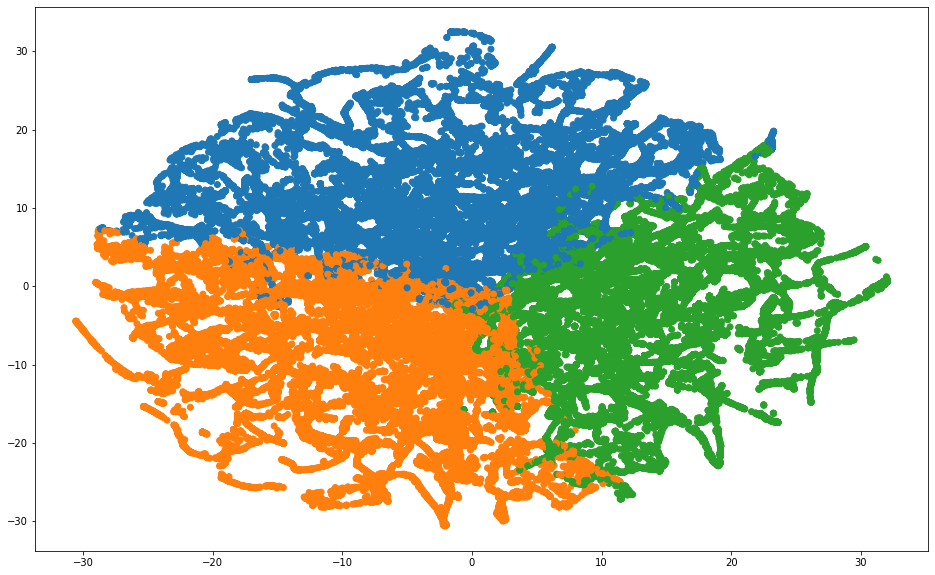

In [60]:
rndperm = np.random.permutation(df.shape[0])
plt.figure(figsize=(16,10))
plt.scatter(x=df["pca-one-tsne"], y=df["pca-two-tsne"], color=mycolors[topic_num])
plt.show()

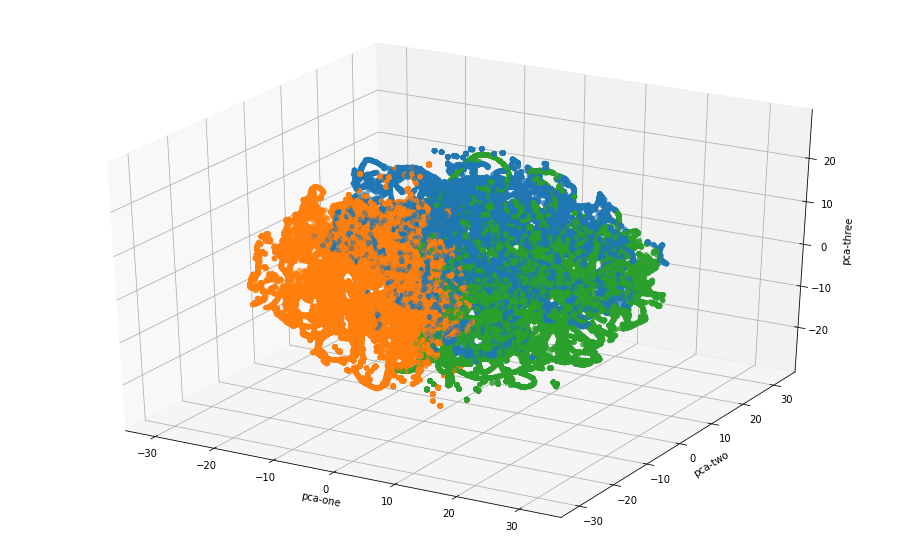

In [61]:
ax = plt.figure(figsize=(16,10)).gca(projection='3d')
ax.scatter(
    xs = df["pca-one-tsne"],
    ys=df["pca-two-tsne"],
    zs=df["pca-three-tsne"],
    color=mycolors[topic_num])
ax.set_xlabel('pca-one')
ax.set_ylabel('pca-two')
ax.set_zlabel('pca-three')
plt.show()

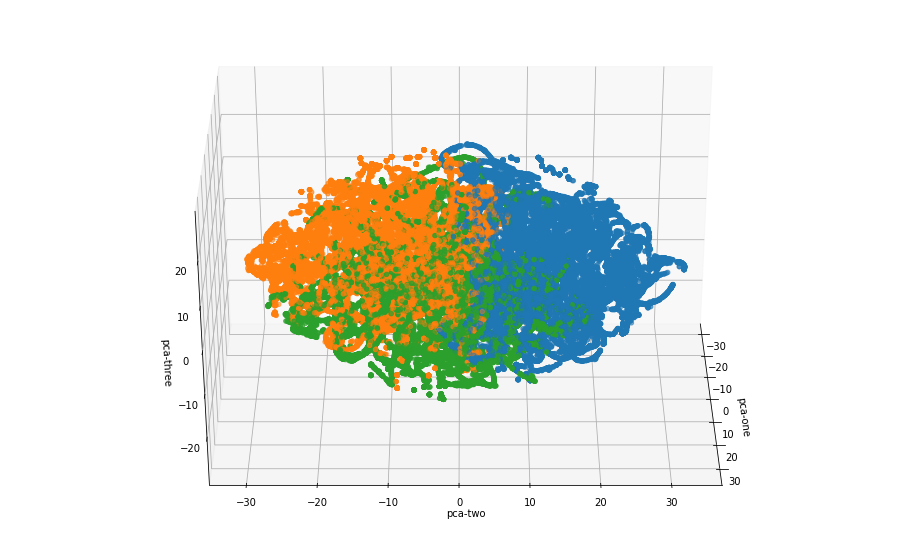

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

In [62]:
# ROTATION
ax = plt.figure(figsize=(16,10)).gca(projection='3d')
ax.scatter(
    xs = df["pca-one-tsne"],
    ys=df["pca-two-tsne"],
    zs=df["pca-three-tsne"],
    color=mycolors[topic_num])
ax.set_xlabel('pca-one')
ax.set_ylabel('pca-two')
ax.set_zlabel('pca-three')
for angle in range(0, 360):
    ax.view_init(30, angle)
    plt.draw()
    plt.pause(.001)
plt.show()

# pyLDAVis

In [59]:
import pyLDAvis.gensim
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim.prepare(lda_model, corpus, dictionary=lda_model.id2word)
pyLDAvis.save_html(vis, 'pyLDAvis.html')
vis

/Users/michellevenables/anaconda3/lib/python3.7/site-packages/pyLDAvis/_prepare.py:257: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.




PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
0      0.270310 -0.206103       1        1  37.345161
1     -0.323625 -0.118649       2        1  35.937164
2      0.053315  0.324752       3        1  26.717669, topic_info=     Category         Freq          Term        Total  loglift  logprob
487   Default  8941.000000         delay  8941.000000  30.0000  30.0000
172   Default  8834.000000          hour  8834.000000  29.0000  29.0000
441   Default  8549.000000      customer  8549.000000  28.0000  28.0000
140   Default  7129.000000       service  7129.000000  27.0000  27.0000
43    Default  6178.000000          time  6178.000000  26.0000  26.0000
198   Default  4219.000000          help  4219.000000  25.0000  25.0000
45    Default  5642.000000           bad  5642.000000  24.0000  24.0000
269   Default  4099.000000          take  4099.000000  23.0000  23.0000
60    Default  4072.000000         great  4072.000000  22.0000  22.0000
69    Default  5409.000000        travel  5409.000000  21.0000  21.0000
529   Default  3803.000000         thank  3803.000000  20.0000  20.0000
110   Default  4807.000000           fly  4807.000000  19.0000  19.0000
462   Default  3640.000000         today  3640.000000  18.0000  18.0000
137   Default  3981.000000        flight  3981.000000  17.0000  17.0000
120   Default  3914.000000           get  3914.000000  16.0000  16.0000
56    Default  3714.000000       airport  3714.000000  15.0000  15.0000
29    Default  3700.000000         never  3700.000000  14.0000  14.0000
88    Default  3552.000000          wait  3552.000000  13.0000  13.0000
455   Default  2706.000000          care  2706.000000  12.0000  12.0000
5     Default  3605.000000          ever  3605.000000  11.0000  11.0000
208   Default  3335.000000         check  3335.000000  10.0000  10.0000
108   Default  3150.000000           day  3150.000000   9.0000   9.0000
214   Default  3261.000000           bag  3261.000000   8.0000   8.0000
420   Default  3215.000000        people  3215.000000   7.0000   7.0000
39    Default  2390.000000          look  2390.000000   6.0000   6.0000
312   Default  2981.000000        cancel  2981.000000   5.0000   5.0000
66    Default  3090.000000          make  3090.000000   4.0000   4.0000
292   Default  2961.000000         still  2961.000000   3.0000   3.0000
434   Default  2779.000000          give  2779.000000   2.0000   2.0000
91    Default  2772.000000          seat  2772.000000   1.0000   1.0000
...       ...          ...           ...          ...      ...      ...
159    Topic3  1832.777954        always  1833.460571   1.3195  -4.5596
532    Topic3  1719.810059          good  1720.464722   1.3195  -4.6232
1491   Topic3  1570.860718      aviation  1571.478027   1.3195  -4.7138
102    Topic3  1345.210815          love  1345.823853   1.3194  -4.8689
338    Topic3  1495.363281          well  1496.062378   1.3194  -4.7631
194    Topic3  1434.105103         would  1434.816162   1.3193  -4.8049
586    Topic3  1417.262695          send  1417.979736   1.3193  -4.8167
500    Topic3  1338.968750          much  1339.659546   1.3193  -4.8736
558    Topic3  1152.882690          hear  1153.508301   1.3193  -5.0232
334    Topic3  1187.774780       amazing  1188.480469   1.3193  -4.9934
320    Topic3   979.538208          team   980.156311   1.3192  -5.1861
5301   Topic3  1022.414124  staralliance  1023.094299   1.3192  -5.1433
305    Topic3  1110.994141          soon  1111.733765   1.3192  -5.0602
8164   Topic3   883.576660    weareunite   884.170410   1.3192  -5.2892
311    Topic3  1003.372925          hope  1004.068787   1.3192  -5.1621
795    Topic3   790.448547      response   791.070862   1.3191  -5.4006
774    Topic3   793.826782         watch   794.475708   1.3190  -5.3963
333    Topic3   862.624634          sure   863.343872   1.3190  -5.3132
975    Topic3   883.575439        number   884.328369   1.3190  -5.2892
268    Topic3  

In [60]:
topic_dic = vis.to_dict
token_table = vis.token_table
data.head()

,tweet,target,target_names
0,"[review, alaska, lounge, seatac, north, satell...",1.0,alaskaairlines
1,"[50, bonus, miles, buy, alaska, mileage, plan,...",1.0,alaskaairlines
2,"[ihr, habt, noch, bis, 2312, um, alaskaairline...",1.0,alaskaairlines
3,"[sucks, ever, since, bankruptcy, another, swin...",1.0,alaskaairlines
4,"[im, looking, folks, network, developers, alas...",1.0,alaskaairlines


In [61]:
df_topic_sents_keywords.head()

,Dominant_Topic,Perc_Contribution,Topic_Keywords,0
0,1.0,0.666,"delay, hour, time, fly, flight, get, airport, ...",[alaskaairline]
1,0.0,0.472,"customer, service, bad, travel, ever, check, b...","[buy, promo, run]"
2,0.0,0.333,"customer, service, bad, travel, ever, check, b...",[]
3,1.0,0.535,"delay, hour, time, fly, flight, get, airport, ...","[suck, ever, bankruptcy, swindle, alaskaairlin..."
4,2.0,0.653,"help, take, great, thank, today, care, look, a...","[folk, network, developer, alaskaairline, andor]"


In [62]:
df1 = df_topic_sents_keywords.reset_index()
df2 = data.reset_index()

In [63]:
result = pd.concat([df1, df2], axis=1, join='inner')
result = result.drop(columns=['index'])
result.head()

,Dominant_Topic,Perc_Contribution,Topic_Keywords,0,tweet,target,target_names
0,1.0,0.666,"delay, hour, time, fly, flight, get, airport, ...",[alaskaairline],"[review, alaska, lounge, seatac, north, satell...",1.0,alaskaairlines
1,0.0,0.472,"customer, service, bad, travel, ever, check, b...","[buy, promo, run]","[50, bonus, miles, buy, alaska, mileage, plan,...",1.0,alaskaairlines
2,0.0,0.333,"customer, service, bad, travel, ever, check, b...",[],"[ihr, habt, noch, bis, 2312, um, alaskaairline...",1.0,alaskaairlines
3,1.0,0.535,"delay, hour, time, fly, flight, get, airport, ...","[suck, ever, bankruptcy, swindle, alaskaairlin...","[sucks, ever, since, bankruptcy, another, swin...",1.0,alaskaairlines
4,2.0,0.653,"help, take, great, thank, today, care, look, a...","[folk, network, developer, alaskaairline, andor]","[im, looking, folks, network, developers, alas...",1.0,alaskaairlines


In [2]:
import pickle
result = pickle.load(open('result.pkl', 'rb'))

In [3]:
result.count(axis=0)

Dominant_Topic       109627
Perc_Contribution    109627
Topic_Keywords       109627
0                    109627
tweet                109627
target               109627
target_names         109627
dtype: int64

In [4]:
type(result)

pandas.core.frame.DataFrame

In [5]:
pickle.dump(result, open("result.pkl", 'wb'))

In [6]:
top_1_alaska

NameError: name 'top_1_alaska' is not defined

In [7]:
result1 = result.loc[result.target_names == "alaskaairlines", "Dominant_Topic"]
result2 = result.loc[result.target_names == "americanairlines", "Dominant_Topic"]
result3 = result.loc[result.target_names == "deltaairlines", "Dominant_Topic"]
result4 = result.loc[result.target_names == "frontierairlines", "Dominant_Topic"]
result5 = result.loc[result.target_names == "jetblueairlines", "Dominant_Topic"]
result6 = result.loc[result.target_names == "southwestairlines", "Dominant_Topic"]
result7 = result.loc[result.target_names == "spiritairlines", "Dominant_Topic"]
result8 = result.loc[result.target_names == "unitedairlines", "Dominant_Topic"]
dom_topics1 = list(result1)
dom_topics2 = list(result2)
dom_topics3 = list(result3)
dom_topics4 = list(result4)
dom_topics5 = list(result5)
dom_topics6 = list(result6)
dom_topics7 = list(result7)
dom_topics8 = list(result8)
top_0_alaska = dom_topics1.count(0.0)
top_1_alaska = dom_topics1.count(1.0)
top_2_alaska = dom_topics1.count(2.0)
top_0_american = dom_topics2.count(0.0)
top_1_american = dom_topics2.count(1.0)
top_2_american = dom_topics2.count(2.0)
top_0_delta = dom_topics3.count(0.0)
top_1_delta = dom_topics3.count(1.0)
top_2_delta = dom_topics3.count(2.0)
top_0_frontier = dom_topics4.count(0.0)
top_1_frontier = dom_topics4.count(1.0)
top_2_frontier = dom_topics4.count(2.0)
top_0_jetblue = dom_topics5.count(0.0)
top_1_jetblue = dom_topics5.count(1.0)
top_2_jetblue = dom_topics5.count(2.0)
top_0_southwest = dom_topics6.count(0.0)
top_1_southwest = dom_topics6.count(1.0)
top_2_southwest = dom_topics6.count(2.0)
top_0_spirit = dom_topics7.count(0.0)
top_1_spirit = dom_topics7.count(1.0)
top_2_spirit = dom_topics7.count(2.0)
top_0_united = dom_topics8.count(0.0)
top_1_united = dom_topics8.count(1.0)
top_2_united = dom_topics8.count(2.0)
total_alaska = top_0_alaska+top_1_alaska+top_2_alaska
total_american = top_0_american+top_1_american+top_2_american
total_delta = top_0_delta+top_1_delta+top_2_delta
total_frontier= top_0_frontier+top_1_frontier+top_2_frontier
total_jetblue= top_0_jetblue+top_1_jetblue+top_2_jetblue
total_southwest= top_0_southwest+top_1_southwest+top_2_southwest
total_spirit= top_0_spirit+top_1_spirit+top_2_spirit
total_united= top_0_united+top_1_united+top_2_united
top_0_per_alaska = round((top_0_alaska/total_alaska)*100,0)
top_1_per_alaska = round((top_1_alaska/total_alaska)*100,0)
top_2_per_alaska = round((top_2_alaska/total_alaska)*100,0)
top_0_per_american = round((top_0_american/total_american)*100,0)
top_1_per_american = round((top_1_american/total_american)*100,0)
top_2_per_american = round((top_2_american/total_american)*100,0)
top_0_per_delta = round((top_0_delta/total_delta)*100,0)
top_1_per_delta = round((top_1_delta/total_delta)*100,0)
top_2_per_delta = round((top_2_delta/total_delta)*100,0)
top_0_per_frontier = round((top_0_frontier/total_frontier)*100,0)
top_1_per_frontier = round((top_1_frontier/total_frontier)*100,0)
top_2_per_frontier = round((top_2_frontier/total_frontier)*100,0)
top_0_per_jetblue= round((top_0_jetblue/total_jetblue)*100,0)
top_1_per_jetblue = round((top_1_jetblue/total_jetblue)*100,0)
top_2_per_jetblue = round((top_2_jetblue/total_jetblue)*100,0)
top_0_per_southwest= round((top_0_southwest/total_southwest)*100,0)
top_1_per_southwest = round((top_1_southwest/total_southwest)*100,0)
top_2_per_southwest = round((top_2_southwest/total_southwest)*100,0)
top_0_per_spirit= round((top_0_spirit/total_spirit)*100,0)
top_1_per_spirit = round((top_1_spirit/total_spirit)*100,0)
top_2_per_spirit = round((top_2_spirit/total_spirit)*100,0)
top_0_per_united= round((top_0_united/total_united)*100,0)
top_1_per_united = round((top_1_united/total_united)*100,0)
top_2_per_united = round((top_2_united/total_united)*100,0)

print('Alaska Airlines')
print('--------------------------')
print('total',total_alaska)
print('--------------------------')
print(top_0_per_alaska)
print(top_1_per_alaska)
print(top_2_per_alaska)
print('\n')
print('American Airlines')
print('--------------------------')
print('total',total_american)
print('--------------------------')
print(top_0_per_american)
print(top_1_per_american)
print(top_2_per_american)
print('\n')
print('Delta Airlines')
print('--------------------------')
print('total',total_delta)
print('--------------------------')
print(top_0_per_delta)
print(top_1_per_delta)
print(top_2_per_delta)
print('\n')
print('Frontier Airlines')
print('--------------------------')
print('total',total_frontier)
print('--------------------------')
print(top_0_per_frontier)
print(top_1_per_frontier)
print(top_2_per_frontier)
print('\n')
print('Jetblue Airlines')
print('--------------------------')
print('total',total_jetblue)
print('--------------------------')
print(top_0_per_jetblue)
print(top_1_per_jetblue)
print(top_2_per_jetblue)
print('\n')
print('Southwest Airlines')
print('--------------------------')
print('total',total_southwest)
print('--------------------------')
print(top_0_per_southwest)
print(top_1_per_southwest)
print(top_2_per_southwest)
print('\n')
print('Spirit Airlines')
print('--------------------------')
print('total',total_spirit)
print('--------------------------')
print(top_0_per_spirit)
print(top_1_per_spirit)
print(top_2_per_spirit)
print('\n')
print('United Airlines')
print('--------------------------')
print('total',total_united)
print('--------------------------')
print(top_0_per_united)
print(top_1_per_united)
print(top_2_per_united)

Alaska Airlines
--------------------------
total 6574
--------------------------
44.0
27.0
28.0


American Airlines
--------------------------
total 40014
--------------------------
40.0
31.0
29.0


Delta Airlines
--------------------------
total 7539
--------------------------
46.0
29.0
24.0


Frontier Airlines
--------------------------
total 10018
--------------------------
53.0
23.0
23.0


Jetblue Airlines
--------------------------
total 10211
--------------------------
50.0
26.0
25.0


Southwest Airlines
--------------------------
total 13260
--------------------------
40.0
26.0
35.0


Spirit Airlines
--------------------------
total 7464
--------------------------
52.0
32.0
16.0


United Airlines
--------------------------
total 14537
--------------------------
43.0
37.0
20.0


In [8]:
total = total_alaska+total_american+total_delta+total_frontier+total_jetblue+total_southwest+total_spirit+total_united

In [87]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly

labels = ['Alaska', 'American', 'Delta', 'United']
values_ = [top_0_per_alaska, top_0_per_american, top_0_per_delta, top_0_per_united]
fig = go.Figure()
fig.add_trace(go.Pie(labels=labels, values=values_))
fig.update_layout(title={'text': "Bad Customer Service",'y':0.9,'x':0.48,'xanchor': 'center','yanchor': 'top'},
                  font=dict(family="Droid Sans",
                            size=18,color="#7f7f7f"))
fig.show()

labels = ['Alaska', 'American', 'Delta', 'United']
values_ = [top_1_per_alaska, top_1_per_american, top_1_per_delta, top_1_per_united]
fig = go.Figure()
fig.add_trace(go.Pie(labels=labels, values=values_))
fig.update_layout(title={'text': "Timing and Delays",'y':0.9,'x':0.48,'xanchor': 'center','yanchor': 'top'},
                  font=dict(family="Droid Sans",
                            size=18,color="#7f7f7f"))
fig.show()

labels = ['Alaska', 'American', 'Delta', 'United']
values_ = [top_2_per_alaska, top_2_per_american, top_2_per_delta, top_2_per_united]
fig = go.Figure()
fig.add_trace(go.Pie(labels=labels, values=values_))
fig.update_layout(title={'text': "Great Experience",'y':0.9,'x':0.48,'xanchor': 'center','yanchor': 'top'},
                  font=dict(family="Droid Sans",
                            size=18,color="#7f7f7f"))
fig.show()


airlines=['Alaska', 'American', 'Delta', 'United']

fig = go.Figure(data=[
    go.Bar(name='Bad Customer Service', x=airlines, y=[top_0_per_alaska, top_0_per_american, top_0_per_delta, top_0_per_united]),
    go.Bar(name='Timing and Delays', x=airlines, y=[top_1_per_alaska, top_1_per_american, top_1_per_delta, top_1_per_united]),
    go.Bar(name='Great Experience', x=airlines, y=[top_2_per_alaska, top_2_per_american, top_2_per_delta, top_2_per_united])
])
# Change the bar mode
fig.update_layout(title = 'Major Airlines Analysis',  barmode='group')
fig.show()

In [126]:
airlines=['Alaska', 'American', 'Delta', 'United', 'JetBlue', 'Southwest', 'Frontier', 'Spirit']

fig = go.Figure(data=[
    go.Bar(name='Bad Customer Service', x=airlines, y=[top_0_per_alaska, top_0_per_american, top_0_per_delta, top_0_per_united, top_0_per_jetblue, top_0_per_southwest, top_0_per_frontier, top_0_per_spirit]),
    go.Bar(name='Timing and Delays', x=airlines, y=[top_1_per_alaska, top_1_per_american, top_1_per_delta, top_1_per_united, top_1_per_jetblue,top_1_per_southwest, top_1_per_frontier,  top_1_per_spirit]),
    go.Bar(name='Great Experience', x=airlines, y=[top_2_per_alaska, top_2_per_american, top_2_per_delta, top_2_per_united, top_2_per_jetblue,top_2_per_southwest, top_2_per_frontier,  top_2_per_spirit])
])
# Change the bar mode
fig.update_layout(title = 'All Airlines', yaxis_title="Percent(%)", barmode='group')
plotly.offline.plot(fig, filename='all_airlines.html')
fig.show()

In [70]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly
# labels = ['Topic_0','Topic_1', 'Topic_2']

# Create subplots, using 'domain' type for pie charts
specs = [[{'type':'domain'}, {'type':'domain'}], [{'type':'domain'}, {'type':'domain'}]]
fig = make_subplots(rows=2, cols=2, specs=specs)
labels = ['Bad customer service','Timing and Delays','Great Experience']
# Define pie charts
fig.add_trace(go.Pie(labels=labels, values=[top_0_alaska, top_1_alaska, top_2_alaska], name='Alaska'), 1, 1)
fig.add_trace(go.Pie(labels=labels, values=[top_0_american, top_1_american, top_2_american], name='American'), 1, 2)
fig.add_trace(go.Pie(labels=labels, values=[top_0_delta, top_1_delta, top_2_delta], name='Delta'), 2, 1)
fig.add_trace(go.Pie(labels=labels, values=[top_0_united, top_1_united, top_2_united], name='United'), 2, 2)
fig.update_layout(title={'text': "Major Airlines",'y':0.9,'x':0.48,'xanchor': 'center','yanchor': 'top'},
                  font=dict(family="Droid Sans", size=18,color="#7f7f7f"))
# plotly.offline.plot(fig, filename='major_airlines.html')
fig.show()

In [102]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly

# labels = ['Topic_0','Topic_1', 'Topic_2']
# Create subplots, using 'domain' type for pie charts
specs = [[{'type':'domain'}, {'type':'domain'}], [{'type':'domain'}, {'type':'domain'}]]
fig = make_subplots(rows=2, cols=2, specs=specs)
labels = ['Bad customer service','Timing and Delays','Great Experience']
# Define pie charts
fig.add_trace(go.Pie(labels=labels, values=[top_0_frontier, top_1_frontier, top_2_frontier], name='Frontier'), 1, 1)
fig.add_trace(go.Pie(labels=labels, values=[top_0_jetblue, top_1_jetblue, top_2_jetblue], name='Jetblue'), 1, 2)
fig.add_trace(go.Pie(labels=labels, values=[top_0_southwest, top_1_southwest, top_2_southwest], name='Southwest'), 2, 1)
fig.add_trace(go.Pie(labels=labels, values=[top_0_spirit, top_1_spirit, top_2_spirit], name='Spirit'), 2, 2)
fig.update_layout(title={'text': "Low Cost Carrier Airlines",'y':0.9,'x':0.48,'xanchor': 'center','yanchor': 'top'},
                  font=dict(family="Droid Sans", size=18,color="#7f7f7f"))
plotly.offline.plot(fig, filename='low_cost_airlines.html')
fig.show()

In [10]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly

specs = [[{'type':'domain'}, {'type':'domain'}]]
fig = make_subplots(rows=1, cols=2, specs=specs)
labels = ['Bad customer service','Timing and Delays','Great Experience']
# Define pie charts

fig.add_trace(go.Pie(labels=labels, values=[top_0_jetblue, top_1_jetblue, top_2_jetblue], name='Jetblue'), 1, 1)
fig.add_trace(go.Pie(labels=labels, values=[top_0_southwest, top_1_southwest, top_2_southwest], name='Southwest'), 1, 2)

fig.update_layout(title={'text': "Low Cost Carrier Airlines",'y':0.95,'x':0.48,'xanchor': 'center','yanchor': 'top'},font=dict(family="Droid Sans", size=35,color="#7f7f7f"))
plotly.offline.plot(fig, filename='low_cost_airlines.html')
fig.show()

In [11]:
# Add in cultural differences
# Airbus vs Boeing aircraft 

import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly

specs = [[{'type':'domain'}, {'type':'domain'}]]
fig = make_subplots(rows=1, cols=2, specs=specs)
labels = ['Bad customer service','Timing and Delays','Great Experience']
# Define pie charts

fig.add_trace(go.Pie(labels=labels, values=[top_0_frontier, top_1_frontier, top_2_frontier], name='Frontier'), 1, 1)
fig.add_trace(go.Pie(labels=labels, values=[top_0_spirit, top_1_spirit, top_2_spirit], name='Spirit'), 1, 2)

fig.update_layout(title={'text': "Ultra Low Cost Carriers",'y':0.99,'x':0.48,'xanchor': 'center','yanchor': 'top'},font=dict(family="Droid Sans", size=35,color="#7f7f7f"))
# plotly.offline.plot(fig, filename='low_cost_airlines.html')
fig.show()


In [106]:
values6 = [top_0_southwest, top_1_southwest, top_2_southwest]
fig = go.Figure()
fig.add_trace(go.Pie(labels=labels, values=values6))
fig.update_layout(title={'text': "Southwest Airlines",'y':0.9,'x':0.48,'xanchor': 'center','yanchor': 'top'},
                  font=dict(family="Droid Sans",
                            size=18))
fig.show()


In [15]:
labels = ['Bad customer service','Timing and Delays','Great Experience']


values7 = [top_0_frontier, top_1_frontier, top_2_frontier]
fig = go.Figure()
fig.add_trace(go.Pie(labels=labels, values=values7))
fig.update_layout(title={'text': "Frontier Airlines",'y':0.98,'x':0.48,'xanchor': 'center','yanchor': 'top'},
                  font=dict(family="Droid Sans",
                            size=35,color="#7f7f7f"))
fig.show()

values4 = [top_0_frontier, top_1_frontier, top_2_frontier]
fig = go.Figure()
fig.add_trace(go.Pie(labels=labels, values=values4))
fig.update_layout(title={'text': "Frontier Airlines",'y':0.9,'x':0.48,'xanchor': 'center','yanchor': 'top'},
                  font=dict(family="Droid Sans",
                            size=18,color="#7f7f7f"))
fig.show()

# GloVe

In [129]:
total_vocabulary = set(word for headline in result['tweet'] for word in headline)
len(total_vocabulary)
print("There are {} unique tokens in the dataset.".format(len(total_vocabulary)))

There are 84367 unique tokens in the dataset.


In [130]:
target = result.target_names

In [131]:
target2 = result.Dominant_Topic

In [132]:
glove = {}
with open('glove.6B.50d.txt', 'rb') as f:
    for line in f:
        parts = line.split()
        word = parts[0].decode('utf-8')
        if word in total_vocabulary:
            vector = np.array(parts[1:], dtype=np.float32)
            glove[word] = vector

In [133]:
glove['american']

array([-1.0988   ,  0.48544  , -0.5004   ,  0.1491   ,  0.41042  ,
        0.32605  , -1.4592   , -0.52025  , -0.088054 , -0.2384   ,
        0.43632  , -0.14949  ,  0.12491  ,  0.71661  ,  0.037183 ,
       -0.60692  ,  0.034298 ,  0.017432 , -0.87692  , -0.21223  ,
        0.10612  ,  0.61057  , -0.44873  , -0.03961  , -0.23466  ,
       -2.0954   , -0.85982  , -0.97872  ,  0.068549 ,  0.2635   ,
        3.0317   , -0.38539  , -0.17444  , -0.47553  , -0.083736 ,
       -0.65646  , -0.768    , -0.30997  , -0.44042  , -0.34611  ,
       -0.15336  ,  0.0090824,  1.2306   , -0.35248  ,  0.87702  ,
        0.31172  , -0.54675  , -0.10366  , -0.86998  ,  0.42675  ],
      dtype=float32)

# Creating Mean Word Embeddings

In [134]:
class W2vVectorizer(object):
    
    def __init__(self, w2v):
        # takes in a dictionary of words and vectors as input
        self.w2v = w2v
        if len(w2v) == 0:
            self.dimensions = 0
        else:
            self.dimensions = len(w2v[next(iter(glove))])
    
    # Note from Mike: Even though it doesn't do anything, it's required that this object implement a fit method or else
    # It can't be used in a sklearn Pipeline. 
    def fit(self, X, y):
        return self
            
    def transform(self, X):
        return np.array([
            np.mean([self.w2v[w] for w in words if w in self.w2v]
                   or [np.zeros(self.dimensions)], axis=0) for words in X])

In [135]:
# Pipelines
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.model_selection import cross_val_score

rf =  Pipeline([("Word2Vec Vectorizer", W2vVectorizer(glove)),
              ("Random Forest", RandomForestClassifier(n_estimators=100, verbose=True))])
svc = Pipeline([("Word2Vec Vectorizer", W2vVectorizer(glove)),
                ('Support Vector Machine', SVC())])
lr = Pipeline([("Word2Vec Vectorizer", W2vVectorizer(glove)),
              ('Logistic Regression', LogisticRegression())])

In [136]:
models = [('Random Forest', rf),
          ("Support Vector Machine", svc),
          ("Logistic Regression", lr)]

In [137]:
scores = [(name, cross_val_score(model, result['tweet'], target, cv=2).mean()) for name, model, in models]

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   39.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    1.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   39.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    1.4s finished
/Users/michellevenables/anaconda3/lib/python3.7/site-packages/sklearn/svm/base.py:193: FutureWarning:

The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.

/Users/michellevenables/anaconda3/lib/python3.7/site-packages/sklearn/svm/base.py:193: FutureWarning:

The d

In [138]:
scores2 = [(name, cross_val_score(model, result['tweet'], target2, cv=2).mean()) for name, model, in models]

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   31.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    1.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   32.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    1.0s finished
/Users/michellevenables/anaconda3/lib/python3.7/site-packages/sklearn/svm/base.py:193: FutureWarning:

The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.

/Users/michellevenables/anaconda3/lib/python3.7/site-packages/sklearn/svm/base.py:193: FutureWarning:

The d

In [139]:
scores

[('Random Forest', 0.5148734492605005),
 ('Support Vector Machine', 0.4328132933776192),
 ('Logistic Regression', 0.4390069034592943)]

In [140]:
scores2

[('Random Forest', 0.6329643640202866),
 ('Support Vector Machine', 0.6376165006391694),
 ('Logistic Regression', 0.6107709280178073)]

In [141]:
from keras.preprocessing.sequence import pad_sequences
from keras.layers import Input, Dense, LSTM, Embedding
from keras.layers import Dropout, Activation, Bidirectional, GlobalMaxPool1D
from keras.models import Model
from keras import initializers, regularizers, constraints, optimizers, layers
from keras.preprocessing import text, sequence

Using TensorFlow backend.
/Users/michellevenables/anaconda3/lib/python3.7/site-packages/google/protobuf/descriptor.py:47: DeprecationWarning:

Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated, and in 3.8 it will stop working



In [142]:
y = pd.get_dummies(target2).values

In [143]:
tokenizer = text.Tokenizer(num_words=100000)
tokenizer.fit_on_texts(list(result.tweet))
list_tokenized_headlines = tokenizer.texts_to_sequences(result.tweet)
X_t = sequence.pad_sequences(list_tokenized_headlines, maxlen=100)

In [144]:
embedding_size = 128
input_ = Input(shape=(100,))
x = Embedding(20000, embedding_size)(input_)
x = LSTM(25, return_sequences=True)(x)
x = GlobalMaxPool1D()(x)
x = Dropout(0.5)(x)
x = Dense(50, activation='relu')(x)
x = Dropout(0.5)(x)
# There are 41 different possible classes, so we use 41 neurons in our output layer
x = Dense(41, activation='softmax')(x)

model = Model(inputs=input_, outputs=x)

In [145]:
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

In [146]:
model.summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 100)               0         
_________________________________________________________________
embedding_1 (Embedding)      (None, 100, 128)          2560000   
_________________________________________________________________
lstm_1 (LSTM)                (None, 100, 25)           15400     
_________________________________________________________________
global_max_pooling1d_1 (Glob (None, 25)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 25)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 50)                1300      
_________________________________________________________________
dropout_2 (Dropout)          (None, 50)                0   